# Classifying Room Occupancy according to <br> Four Environmental Factors

## 1. Introduction
In today’s world, the use of home-based technology systems is becoming increasingly utilized for our convenience. Household technology such as Alexa, Google Assistant and Siri are often an integral aspect of many people’s lives. We want to explore how this technology can be maximized by analyzing how it can detect occupancy in a room.

Our dataset analyzes room occupancy based on the measurements of temperature, humidity, light, and CO2 levels in the room. Occupancy is the categorical variable with two possible outcomes: occupied or unoccupied. We found this dataset interesting due to its suitability for classification analysis with simple categorical variables and transparent environmental variables. Specifically, we wanted to analyze the question: Is the room occupied based on temperature, humidity, light, and CO2 levels?

## 2. Preliminary Exploratory Data Analysis

#### Accessing Data

In [2]:
#load in the necessary libraries
library(tidyverse)
library(repr)
library(tidymodels)

#.zip file is downloaded, unzipped and read in
temp <- tempfile()
download.file("https://archive.ics.uci.edu/static/public/357/occupancy+detection.zip",temp)
data <- read.csv(unz(temp, "datatraining.txt"))
unlink(temp)

#data is saved as a tibble for future data wrangling
occupancyData <- tibble(data)
head(occupancyData)

Warning message:
“package ‘ggplot2’ was built under R version 4.3.2”
── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.5.0     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
── Attaching packages ────────────────────────────────────── tidymodels 1.1.1 ──

✔ broom        1.0.5     ✔ rsample      1.2.0
✔ dials        1.2.0     ✔ tune         1.1.2
✔ infer        1.0.5     ✔ workflows    1.1.3
✔ modeldata    1.2.0     ✔ workflowsets 1.0.1
✔ parsnip      1.1.1     ✔ yardstick    1.2.0
✔ recipes      1.0.8     

── Conflicts ───────────────────────────────────────── tidymodels_co

date,Temperature,Humidity,Light,CO2,HumidityRatio,Occupancy
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2015-02-04 17:51:00,23.18,27.2720,426.0,721.25,0.004792988,1
2015-02-04 17:51:59,23.15,27.2675,429.5,714.00,0.004783441,1
2015-02-04 17:53:00,23.15,27.2450,426.0,713.50,0.004779464,1
2015-02-04 17:54:00,23.15,27.2000,426.0,708.25,0.004771509,1
2015-02-04 17:55:00,23.10,27.2000,426.0,704.50,0.004756993,1
2015-02-04 17:55:59,23.10,27.2000,419.0,701.00,0.004756993,1


#### Selecting Necessary Columns

In [3]:
#date and Humidity Ratio are removed as they are not needed, all other columns are kept

selectedOccupancyData <- occupancyData[,-c(1, 6)]
head(selectedOccupancyData)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.18,27.2720,426.0,721.25,1
23.15,27.2675,429.5,714.00,1
23.15,27.2450,426.0,713.50,1
23.15,27.2000,426.0,708.25,1
23.10,27.2000,426.0,704.50,1
23.10,27.2000,419.0,701.00,1


#### Splitting Data For Training / Testing

In [4]:
#data is split into training and testing sets using a 75/25 split

occupancy_split <- initial_split(selectedOccupancyData, prop = 0.75, strata = Occupancy)  
occupancy_train <- training(occupancy_split)
occupancy_test <- testing(occupancy_split)

head(occupancy_train)
head(occupancy_test)

Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.000,27.200,0,681.5,0
22.945,27.290,0,685.0,0
22.890,27.390,0,689.0,0
22.890,27.390,0,689.5,0
22.890,27.390,0,689.0,0
22.890,27.445,0,691.0,0


Temperature,Humidity,Light,CO2,Occupancy
<dbl>,<dbl>,<dbl>,<dbl>,<int>
23.180,27.27200,426,721.2500,1
23.100,27.20000,419,701.6667,1
23.075,27.15000,419,690.2500,1
23.100,27.16667,419,683.5000,1
22.945,27.39000,0,685.0000,0
22.790,27.50000,0,688.0000,0


#### Summarizing the Data
We will summarize the data, counting the various values and checking for empty/NA

In [5]:
# Summarizing the data
summary_table <- occupancy_train |>
    # Summarize each column
    summarise(
        Total_Observations = n(),
        Missing_Temperature = sum(is.na(Temperature)),
        Mean_Temperature = mean(Temperature, na.rm = TRUE),
        Missing_Humidity = sum(is.na(Humidity)),
        Mean_Humidity = mean(Humidity, na.rm = TRUE),
        Missing_Light = sum(is.na(Light)),
        Mean_Light = mean(Light, na.rm = TRUE),
        Missing_CO2 = sum(is.na(CO2)),
        Mean_CO2 = mean(CO2, na.rm = TRUE),
        Occupancy_Count_0 = sum(Occupancy == 0, na.rm = TRUE),
        Occupancy_Count_1 = sum(Occupancy == 1, na.rm = TRUE))

# View the summary table
summary_table

Total_Observations,Missing_Temperature,Mean_Temperature,Missing_Humidity,Mean_Humidity,Missing_Light,Mean_Light,Missing_CO2,Mean_CO2,Occupancy_Count_0,Occupancy_Count_1
<int>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<int>
6106,0,20.61985,0,25.72938,0,119.1814,0,606.915,4810,1296


#### Visualizing the Data

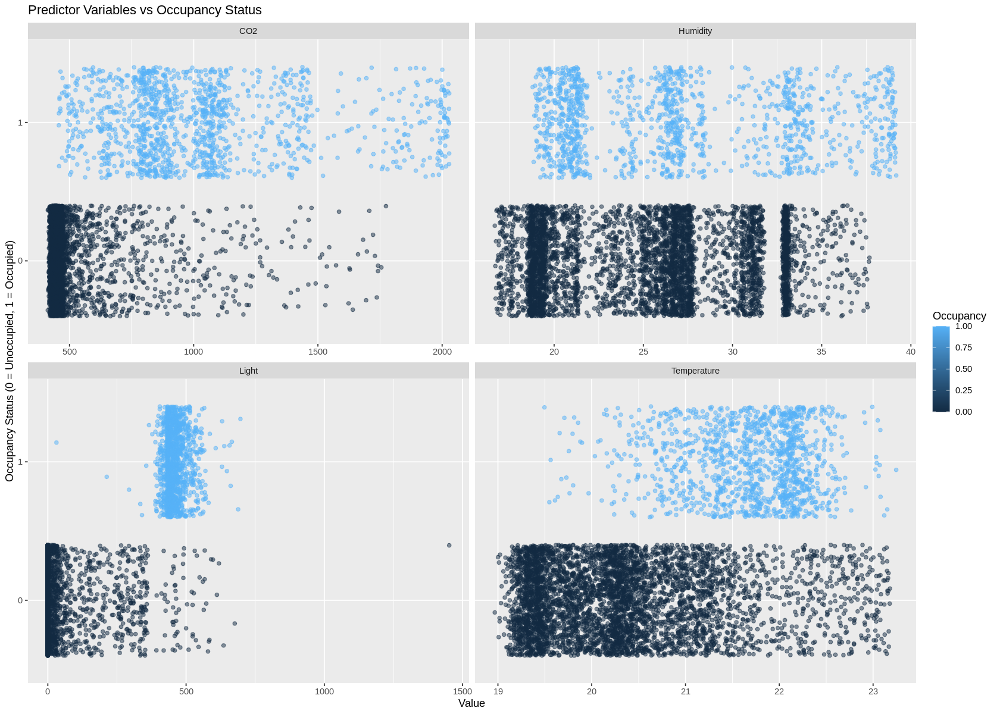

In [6]:
options(repr.plot.width=14, repr.plot.height=10)

# Reshape data to long format for faceting
occupancy_long <- occupancy_train |>
    pivot_longer(cols = -Occupancy, names_to = "variable", values_to = "value")

# Create a 2x2 grid of scatterplots with jitter
combined_plot <- ggplot(occupancy_long, aes(x = value, y = as.factor(Occupancy), color= as.factor(Occupancy))) +
    geom_jitter(alpha = 0.5, width = 0.1) +
    facet_wrap(~variable, scales = "free_x", ncol = 2) +
    labs(x = "Value", y = "Occupancy Status (0 = Unoccupied, 1 = Occupied)", title = "Predictor Variables vs Occupancy Status")

# Print the combined plot
print(combined_plot)

Each of these 4 graphs is ultimately the same, except for having different values on the x-axis (denoted in title of each graph).
These graphs are useful to show the distribution of our different predictor variables and how they are distributed among the two y-axis cases of the room being occupied vs unoccupied.

Note the usage of a jitter-plot instead of a typical scatter plot, as many of the values would otherwise overlap and make it harder to understand the distribution of points.

## 3. Methods
We will begin by importing the Occupancy Detection dataset into Jupyter, focusing on Temperature, Humidity, Light, and CO2 to forecast room occupancy, while discarding “date” and “Humidity Ratio” to avoid redundancy and overemphasis on humidity in our KNN model. After preprocessing, the dataset will be divided into a 75% training set and a 25% testing set. We’ll determine the optimal K for the KNN model by performing cross-validation with 5 folds on the training data, incorporating a preprocessing recipe and the KNN model with a tunable K parameter. The K yielding the highest accuracy will be selected for retraining the KNN classifier on the full training dataset before making predictions on the test set. Finally, we will use a confusion matrix and a stacked bar graph comparing predicted to actual occupancy to assess the model’s performance.

## 4. Expected Outcomes and Significance
We expect higher humidities, temperatures, light and CO2 levels when a room is occupied. These findings could be utilized by household technology companies, allowing them to develop automatic lighting systems that incorporate more efficient sensors, thus improving the accuracy of occupancy detection for better lighting control. This study is not only limited to temperature, humidity, light, and CO2 levels; future studies could explore other measurements such as oxygen levels, noise levels, or dust particles in the room. By analyzing more variables, the occupancy detection of household systems will be optimized, significantly boosting the quality of life of millions around the world.

## 5. Training Classification and Testing Individual Variables

In [ ]:
# Mutate both training and testing data to convert the Occupancy column to a factor rather than an integer
occupancy_train <- occupancy_train |>
    mutate(Occupancy = factor(Occupancy))
occupancy_test <- occupancy_test |>
    mutate(Occupancy = factor(Occupancy))


options(repr.plot.width=8, repr.plot.height=6)
# Create a recipe for each predictor
recipe_temp <- recipe(Occupancy ~ Temperature, data = occupancy_train)
recipe_hum <- recipe(Occupancy ~ Humidity, data = occupancy_train)
recipe_light <- recipe(Occupancy ~ Light, data = occupancy_train)
recipe_co2 <- recipe(Occupancy ~ CO2, data = occupancy_train)

# Set up the knn specification
knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
    set_engine("kknn") |>
    set_mode("classification")

# Set up the resampling
folds <- vfold_cv(occupancy_train, v = 5)

# Create a function to tune and evaluate the model for a given recipe
tune_and_evaluate <- function(recipe) {
  results <- workflow() |>
    add_recipe(recipe) |>
    add_model(knn_spec) |>
    tune_grid(resamples = folds, grid = tibble(neighbors = 1:10)) |>
    collect_metrics() |>
    filter(.metric == "accuracy")
  return(results)
}

# Evaluate each predictor
results_temp <- tune_and_evaluate(recipe_temp)
results_hum <- tune_and_evaluate(recipe_hum)
results_light <- tune_and_evaluate(recipe_light)
results_co2 <- tune_and_evaluate(recipe_co2)

Now we have accuracy data for each of our individual predictor variables, and we can check the best number of neighbours, as well as the max accuracy when using a single variable. This is valuable data as it allows us to make several more predictions about our final model before it is finalized, and understand the data we're working with.

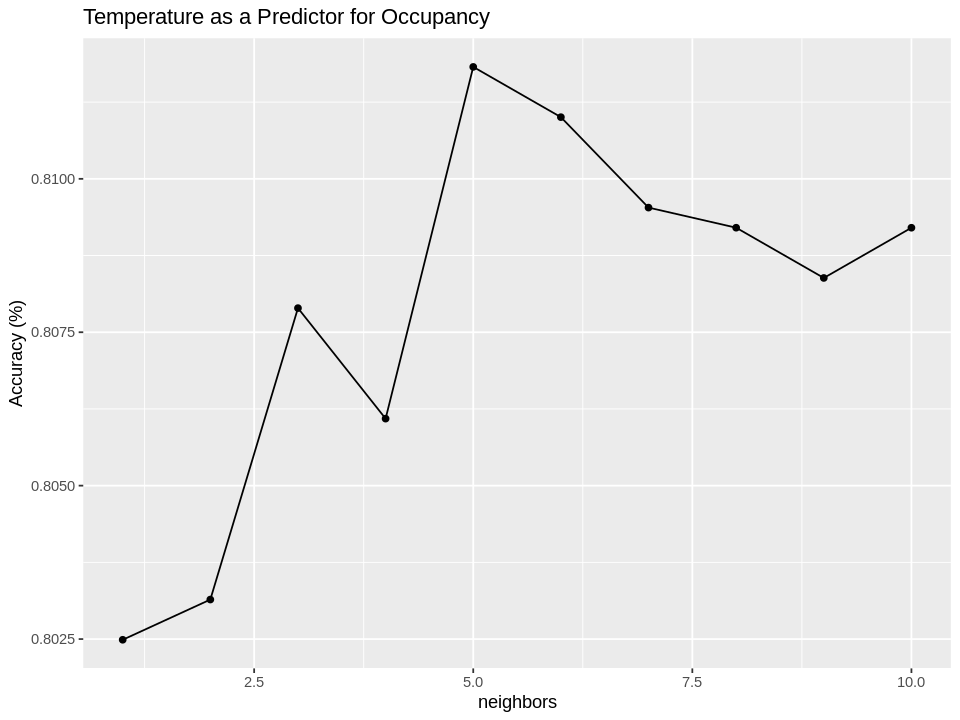

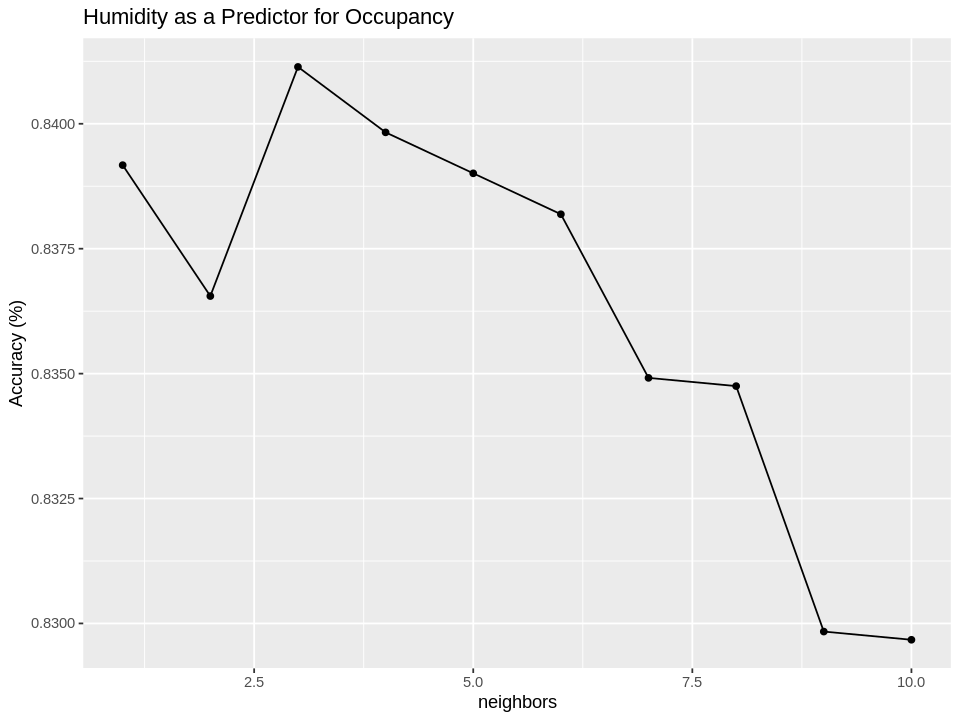

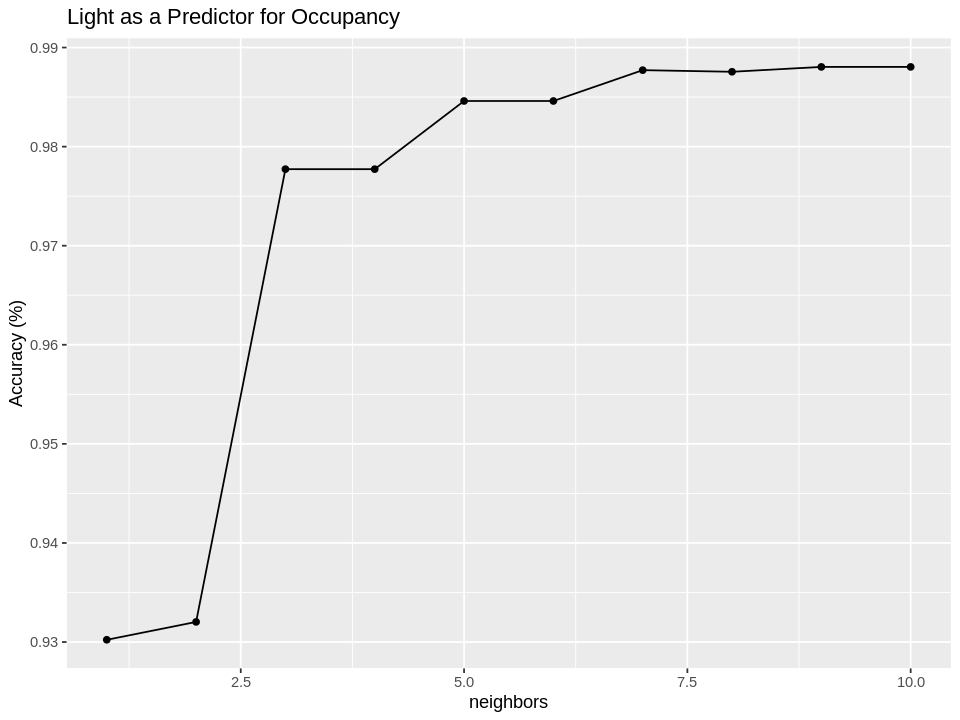

Highest accuracy for temperature is 0.8118238 at 5 neighbours.
Highest accuracy for humidity is 0.8411381 at 3 neighbours.
Highest accuracy for light is 0.988045 at 9 neighbours.
Highest accuracy for CO2 is 0.9189331 at 10 neighbours.


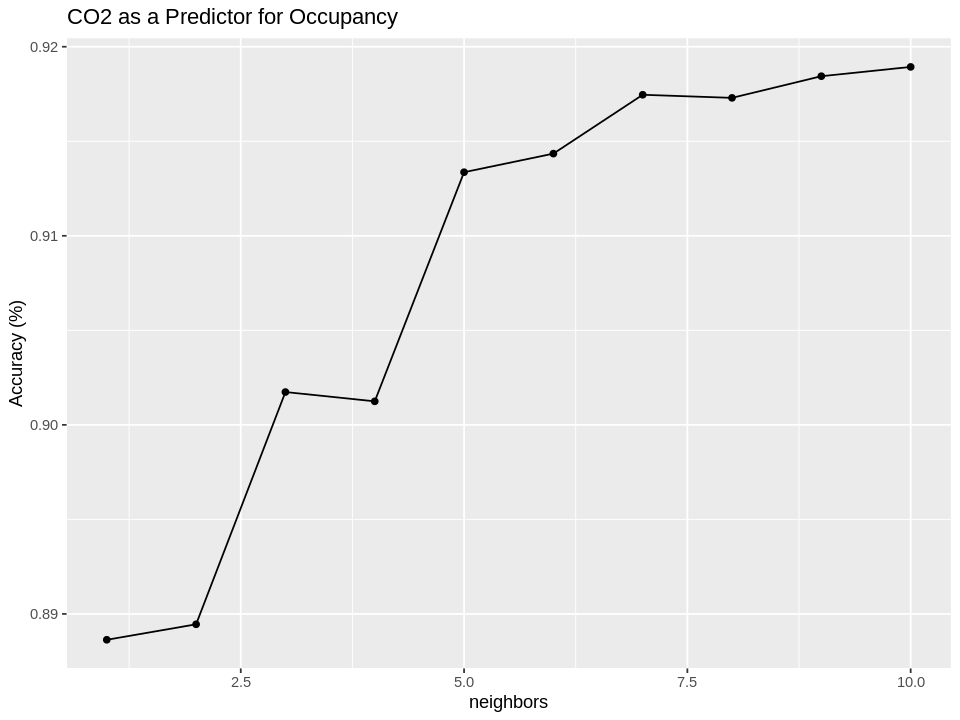

In [20]:
# Plot the results and look at the accuracy to compare
ggplot(results_temp, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Temperature as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_hum, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Humidity as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_light, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("Light as a Predictor for Occupancy") +
    ylab("Accuracy (%)")

ggplot(results_co2, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    ggtitle("CO2 as a Predictor for Occupancy") +
    ylab("Accuracy (%)")


# Delay ensures execution in the correct order
Sys.sleep(1)
# STILL BROKEN

cat("Highest accuracy for temperature is", max(results_temp$mean), "at", which.max(results_temp$mean), "neighbours.\n")
cat("Highest accuracy for humidity is", max(results_hum$mean), "at", which.max(results_hum$mean), "neighbours.\n")
cat("Highest accuracy for light is", max(results_light$mean), "at", which.max(results_light$mean), "neighbours.\n")
cat("Highest accuracy for CO2 is", max(results_co2$mean), "at", which.max(results_co2$mean), "neighbours.\n")

From our outputs it's clearly visible that, when using a single variable, light is the most accurate at 98.8% with 9 neighbours being used to predict the value. The least accurate predictor variable at 81.2% is temperature.
Looking at the graphs and the printed output values, the best value k for number of neighbours is 5, 3, 9, 10. Averaging these out we get about 7, but since the two most accurate predictors have higher values, it's very possible that when training our model using all variables our k will be 8, 9, or 10.

The next step is to train a classification model using all 4 predictor variables.

neighbors,.metric,.estimator,mean,n,std_err,.config
<int>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9934487,5,0.0008195036,Preprocessor1_Model01
2,accuracy,binary,0.9934487,5,0.0008195036,Preprocessor1_Model02
3,accuracy,binary,0.9944316,5,0.0004778319,Preprocessor1_Model03
4,accuracy,binary,0.9944316,5,0.0004778319,Preprocessor1_Model04
5,accuracy,binary,0.9931215,5,0.0009896918,Preprocessor1_Model05
6,accuracy,binary,0.9931215,5,0.0009896918,Preprocessor1_Model06
7,accuracy,binary,0.9926302,5,0.0006852263,Preprocessor1_Model07
8,accuracy,binary,0.9926302,5,0.0006852263,Preprocessor1_Model08
9,accuracy,binary,0.9921391,5,0.0006647255,Preprocessor1_Model09


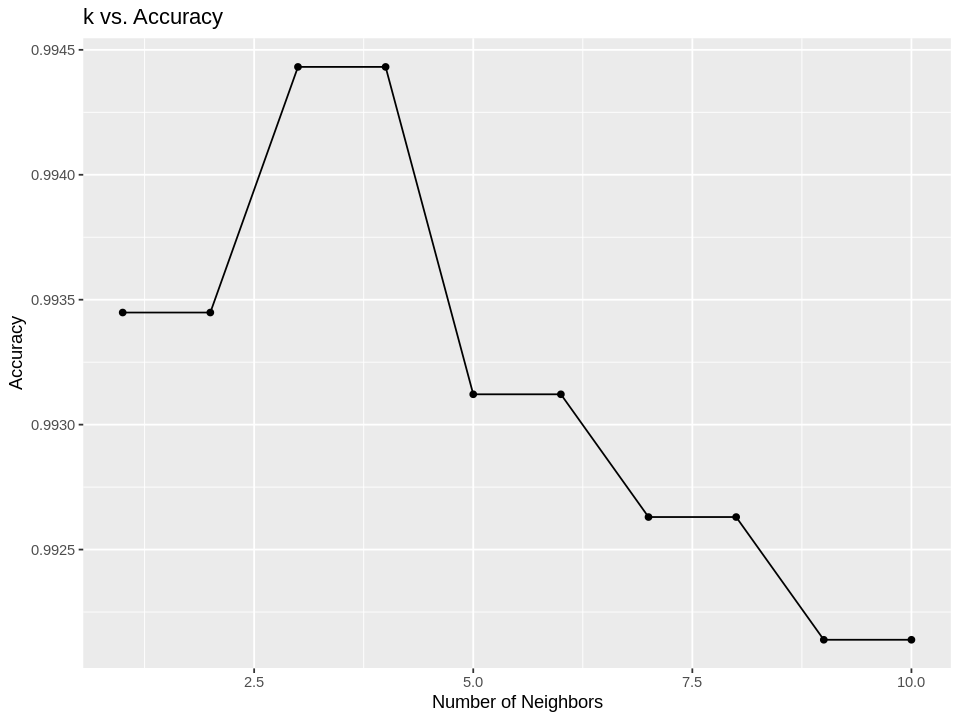

In [21]:
recipe <- recipe(Occupancy ~ ., data = occupancy_train)


knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
    set_engine("kknn") |>
    set_mode("classification")

folds <- vfold_cv(occupancy_train, v = 5)

results <- workflow() |>
    add_recipe(recipe) |>
    add_model(knn_spec) |>
    tune_grid(resamples = folds, grid = tibble(neighbors = 1:10)) |>
    collect_metrics()

results <- filter(results, .metric == "accuracy")

cross_val_plot <- ggplot(results, aes(x = neighbors, y = mean)) +
    geom_point() +
    geom_line() +
    labs(x = "Number of Neighbors", y = "Accuracy", title = "k vs. Accuracy")

cross_val_plot
results

It seems the best k-value is 3 or 4 (same accuracy), which provices an accuracy of 99.4%
We'll further discuss the results after we finalize our model and make a confusion matrix.

In [26]:
occup_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 4) |>
    set_engine("kknn") |>
    set_mode("classification")

occup_fit <- workflow() |>
    add_recipe(recipe) |>
    add_model(occup_spec) |>
    fit(data = occupancy_train)

occup_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
0 Recipe Steps

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(4,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.00589584
Best kernel: rectangular
Best k: 4

In [27]:
occup_predictions <- predict(occup_fit, new_data = occupancy_test)

occup_metrics <- occupancy_test |>
    bind_cols(occup_predictions) |>
    metrics(truth = Occupancy, estimate = .pred_class)

accuracy <- occup_metrics |> 
    filter(.metric == "accuracy")

accuracy


occup_conf_mat <- occupancy_test |>
    bind_cols(occup_predictions) |>
    conf_mat(truth = Occupancy, estimate = .pred_class)


occup_conf_mat

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9926362


          Truth
Prediction    0    1
         0 1594    5
         1   10  428

Finally, we have:

Accuracy = (TP + TN) / (TP + TN + FP + FN)
= (428 + 1594) / (428 + 1594 + 5 + 10)

= 99.26%
General measure of accuracy.



Recall = TP/(TP + FN)
= 428 / (428 + 10)

= 97.72%
How often we correctly predicted a room as being occupied, good for energy savings so things turn off in an empty room.

Specificity or "True Negative Rate" = TN / (TN + FP)
= 1594 / (1594 + 5)

= 99.69%
How often we correctly predicted a room as being empty, good so things turn on when a room is occupied.